<a href="https://colab.research.google.com/github/adiacla/diabetes/blob/main/Riesgo_Diabetes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CUADERNO DE ANALISIS DE RIESGO DE DIABETES**

![image](https://www.insideprecisionmedicine.com/wp-content/uploads/2019/01/360.jpeg)


Este proyecto es un ejemplo del los pasos de la metodología CRISP para el desarrollo de modelos en ciencias de Datos (IA).

Nos basamos en el conjunto de datos en Kaggle que contiene 9,538 registros médicos relacionados con el diagnóstico de diabetes y factores de riesgo. Incluye diversos parámetros de salud, hábitos de vida y predisposiciones genéticas que contribuyen al riesgo de diabetes. Los datos están estructurados con distribuciones realistas, lo que los hace valiosos para la investigación médica, el análisis estadístico y las aplicaciones de aprendizaje automático.



![imagen](https://github.com/adiacla/diabetes/blob/main/imagenes/crispdatos.jpg?raw=true)

##Entendimiento de los datos

| Variable en Inglés        | Variable en Español         | Descripción de la Columna                                             |
|---------------------------|-----------------------------|----------------------------------------------------------------------|
| **Age**                    | **Edad**                    | La edad del individuo (18-90 años).                                   |
| **Pregnancies**            | **Embarazos**               | Número de veces que la paciente ha estado embarazada.                 |
| **BMI (Body Mass Index)**  | **IMC (Índice de Masa Corporal)** | Una medida de la grasa corporal basada en la altura y el peso (kg/m²). |
| **Glucose**                | **Glucosa**                 | Concentración de glucosa en sangre (mg/dL), un indicador clave de diabetes. |
| **BloodPressure**          | **Presión Arterial**        | Presión arterial sistólica (mmHg), niveles más altos pueden indicar hipertensión. |
| **HbA1c**                  | **HbA1c (Hemoglobina A1c)** | Nivel de hemoglobina A1c (%), que representa el promedio de glucosa en sangre durante meses. |
| **LDL (Low-Density Lipoprotein)** | **LDL (Lipoproteínas de Baja Densidad)** | Nivel de colesterol "malo" (mg/dL).                                   |
| **HDL (High-Density Lipoprotein)** | **HDL (Lipoproteínas de Alta Densidad)** | Nivel de colesterol "bueno" (mg/dL).                                  |
| **Triglycerides**          | **Triglicéridos**           | Niveles de grasa en la sangre (mg/dL), valores altos aumentan el riesgo de diabetes. |
| **WaistCircumference**     | **Circunferencia de Cintura** | Medición de la cintura (cm), un indicador de obesidad central.        |
| **HipCircumference**       | **Circunferencia de Cadera** | Medición de la cadera (cm), utilizada para calcular la relación cintura-cadera (WHR). |
| **WHR (Waist-to-Hip Ratio)** | **WHR (Relación Cintura-Cadera)** | Relación de la circunferencia de la cintura dividida por la circunferencia de la cadera. |
| **FamilyHistory**          | **Historial Familiar**      | Indica si el individuo tiene antecedentes familiares de diabetes (1 = Sí, 0 = No). |
| **DietType**               | **Tipo de Dieta**           | Hábitos alimenticios (0 = Desequilibrada, 1 = Equilibrada, 2 = Vegana/Vegetariana). |
| **Hypertension**           | **Hipertensión**            | Presencia de presión arterial alta (1 = Sí, 0 = No).                  |
| **MedicationUse**          | **Uso de Medicación**       | Indica si el individuo está tomando medicamentos (1 = Sí, 0 = No).    |
| **Outcome**                | **Resultado**               | Resultado del diagnóstico de diabetes (1 = Diabetes, 0 = No Diabetes). |


Este conjunto de datos es útil para explorar las relaciones entre las elecciones de estilo de vida, los factores genéticos y el riesgo de diabetes, proporcionando valiosos conocimientos para la modelización predictiva y el análisis de salud.

In [49]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


## Importar el dataset

In [50]:
df = pd.read_csv('https://raw.githubusercontent.com/adiacla/bigdata/refs/heads/master/diabetes_dataset.csv')

![imagen](https://github.com/adiacla/diabetes/blob/main/imagenes/crisppreparacion.jpg?raw=true)

##EDA-Analisis de datos

In [51]:
df.head()

,Age,Pregnancies,BMI,Glucose,BloodPressure,HbA1c,LDL,HDL,Triglycerides,WaistCircumference,HipCircumference,WHR,FamilyHistory,DietType,Hypertension,MedicationUse,Outcome
0,69,5,28.39,130.1,77.0,5.4,130.4,44.0,50.0,90.5,107.9,0.84,0,0,0,1,0
1,32,1,26.49,116.5,72.0,4.5,87.4,54.2,129.9,113.3,81.4,1.39,0,0,0,0,0
2,89,13,25.34,101.0,82.0,4.9,112.5,56.8,177.6,84.7,107.2,0.79,0,0,0,1,0
3,78,13,29.91,146.0,104.0,5.7,50.7,39.1,117.0,108.9,110.0,0.99,0,0,0,1,1
4,38,8,24.56,103.2,74.0,4.7,102.5,29.1,145.9,84.1,92.8,0.91,0,1,0,0,0


In [52]:
df.tail()

,Age,Pregnancies,BMI,Glucose,BloodPressure,HbA1c,LDL,HDL,Triglycerides,WaistCircumference,HipCircumference,WHR,FamilyHistory,DietType,Hypertension,MedicationUse,Outcome
9533,32,3,23.00,102.3,62.0,4.1,109.3,47.8,76.7,86.8,115.0,0.75,0,0,0,0,0
9534,74,0,24.29,125.8,93.0,5.3,95.8,66.6,103.7,90.1,94.3,0.96,1,0,0,1,1
9535,75,6,26.10,107.6,75.0,5.0,168.5,62.3,149.8,84.0,114.9,0.73,0,0,0,1,0
9536,52,1,25.88,99.3,96.0,4.6,70.0,48.4,122.9,97.5,88.7,1.10,1,0,0,0,1
9537,33,3,25.61,69.1,65.0,4.0,69.0,59.4,169.5,79.7,101.1,0.79,0,1,0,0,0


In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9538 entries, 0 to 9537
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 9538 non-null   int64  
 1   Pregnancies         9538 non-null   int64  
 2   BMI                 9538 non-null   float64
 3   Glucose             9538 non-null   float64
 4   BloodPressure       9538 non-null   float64
 5   HbA1c               9538 non-null   float64
 6   LDL                 9538 non-null   float64
 7   HDL                 9538 non-null   float64
 8   Triglycerides       9538 non-null   float64
 9   WaistCircumference  9538 non-null   float64
 10  HipCircumference    9538 non-null   float64
 11  WHR                 9538 non-null   float64
 12  FamilyHistory       9538 non-null   int64  
 13  DietType            9538 non-null   int64  
 14  Hypertension        9538 non-null   int64  
 15  MedicationUse       9538 non-null   int64  
 16  Outcom

In [54]:
df.describe()

,Age,Pregnancies,BMI,Glucose,BloodPressure,HbA1c,LDL,HDL,Triglycerides,WaistCircumference,HipCircumference,WHR,FamilyHistory,DietType,Hypertension,MedicationUse,Outcome
count,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000,9538.000000
mean,53.577584,7.986161,27.052364,106.104183,84.475781,4.650661,100.133456,49.953418,151.147746,93.951678,103.060621,0.917400,0.302474,0.486161,0.001048,0.405012,0.344097
std,20.764651,4.933469,5.927955,21.918590,14.123480,0.476395,29.911910,15.242194,48.951627,15.594468,13.438827,0.140828,0.459354,0.661139,0.032364,0.490920,0.475098
min,18.000000,0.000000,15.000000,50.000000,60.000000,4.000000,-12.000000,-9.200000,50.000000,40.300000,54.800000,0.420000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,36.000000,4.000000,22.870000,91.000000,74.000000,4.300000,80.100000,39.700000,117.200000,83.400000,94.000000,0.820000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,53.000000,8.000000,27.050000,106.000000,84.000000,4.600000,99.900000,50.200000,150.550000,93.800000,103.200000,0.910000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,72.000000,12.000000,31.180000,121.000000,94.000000,5.000000,120.200000,60.200000,185.100000,104.600000,112.100000,1.010000,1.000000,1.000000,0.000000,1.000000,1.000000
max,89.000000,16.000000,49.660000,207.200000,138.000000,6.900000,202.200000,107.800000,345.800000,163.000000,156.600000,1.490000,1.000000,2.000000,1.000000,1.000000,1.000000


In [56]:
df.corr()

,Age,Pregnancies,BMI,Glucose,BloodPressure,HbA1c,LDL,HDL,Triglycerides,WaistCircumference,HipCircumference,WHR,FamilyHistory,DietType,Hypertension,MedicationUse,Outcome
Age,1.000000,0.010714,0.021794,0.487808,0.429335,0.396354,-0.003871,-0.009566,0.010470,0.025591,0.020944,0.009933,-0.012887,-0.002629,0.038417,0.852709,0.068453
Pregnancies,0.010714,1.000000,-0.013993,0.007126,-0.008272,0.009060,0.006717,-0.000258,0.005732,-0.018595,-0.006866,-0.013982,-0.017077,-0.002277,-0.011730,0.001795,-0.018189
BMI,0.021794,-0.013993,1.000000,0.556683,0.605405,0.459852,0.019921,-0.018188,-0.014392,0.761734,0.662458,0.252677,0.008037,-0.017386,0.073731,0.016819,0.107248
Glucose,0.487808,0.007126,0.556683,1.000000,0.541987,0.817493,0.019576,-0.020587,-0.008765,0.428944,0.372786,0.142554,-0.005163,-0.017350,0.072806,0.415119,0.168325
BloodPressure,0.429335,-0.008272,0.605405,0.541987,1.000000,0.444980,0.000265,-0.011031,-0.014742,0.460178,0.400626,0.152305,0.001396,-0.008739,0.103512,0.369046,0.096361
HbA1c,0.396354,0.009060,0.459852,0.817493,0.444980,1.000000,0.011975,-0.023278,-0.016009,0.352626,0.308792,0.114624,-0.007981,-0.016617,0.071363,0.339440,0.151506
LDL,-0.003871,0.006717,0.019921,0.019576,0.000265,0.011975,1.000000,-0.015700,0.010864,0.017321,0.018431,0.004223,0.018212,-0.011198,-0.002842,-0.001482,0.019497
HDL,-0.009566,-0.000258,-0.018188,-0.020587,-0.011031,-0.023278,-0.015700,1.000000,-0.013875,-0.016538,-0.008864,-0.008545,-0.005171,-0.007914,-0.010167,-0.023659,-0.008837
Triglycerides,0.010470,0.005732,-0.014392,-0.008765,-0.014742,-0.016009,0.010864,-0.013875,1.000000,-0.005237,-0.002494,-0.003194,-0.004994,0.020503,0.001233,0.017658,-0.008487
WaistCircumference,0.025591,-0.018595,0.761734,0.428944,0.460178,0.352626,0.017321,-0.016538,-0.005237,1.000000,0.512328,0.644492,0.011753,-0.031460,0.036728,0.024709,0.087492


In [57]:
df.dtypes

,0
Age,int64
Pregnancies,int64
BMI,float64
Glucose,float64
BloodPressure,float64
HbA1c,float64
LDL,float64
HDL,float64
Triglycerides,float64
WaistCircumference,float64


In [58]:
df.isnull().sum()

,0
Age,0
Pregnancies,0
BMI,0
Glucose,0
BloodPressure,0
HbA1c,0
LDL,0
HDL,0
Triglycerides,0
WaistCircumference,0


In [59]:
df.duplicated().sum()

0

In [60]:
df. columns

Index(['Age', 'Pregnancies', 'BMI', 'Glucose', 'BloodPressure', 'HbA1c', 'LDL',
       'HDL', 'Triglycerides', 'WaistCircumference', 'HipCircumference', 'WHR',
       'FamilyHistory', 'DietType', 'Hypertension', 'MedicationUse',
       'Outcome'],
      dtype='object')

## EDA- Visualización de Data

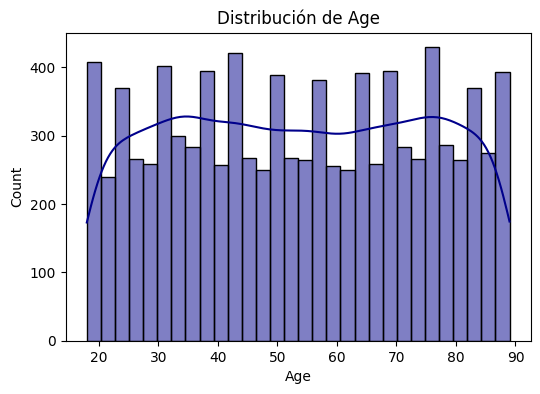

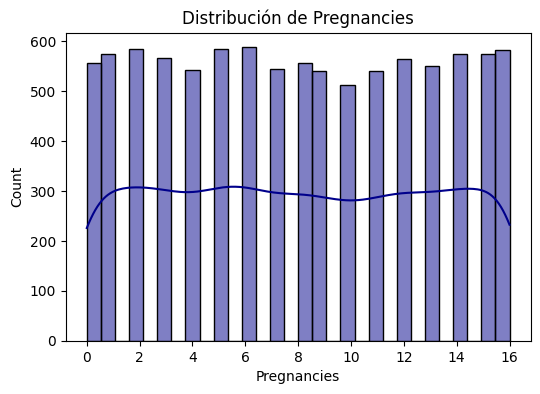

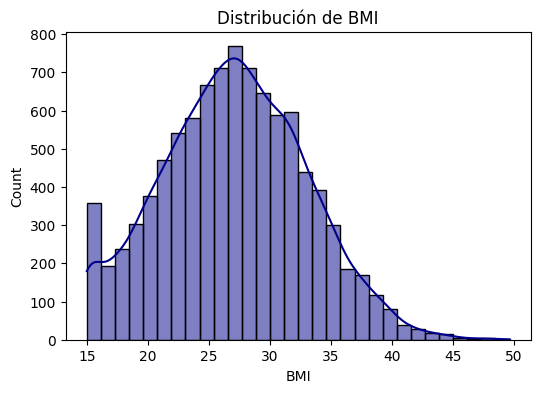

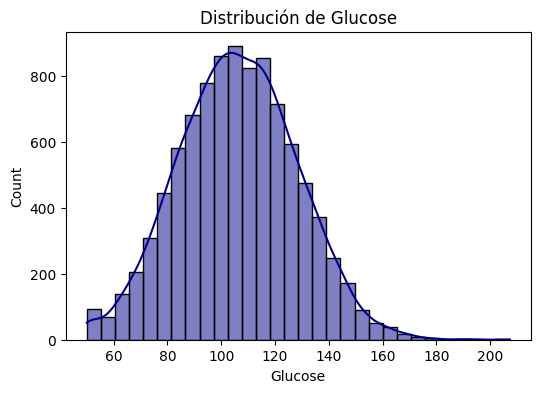

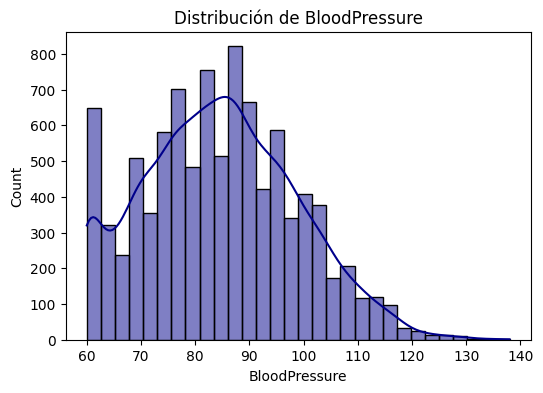

...

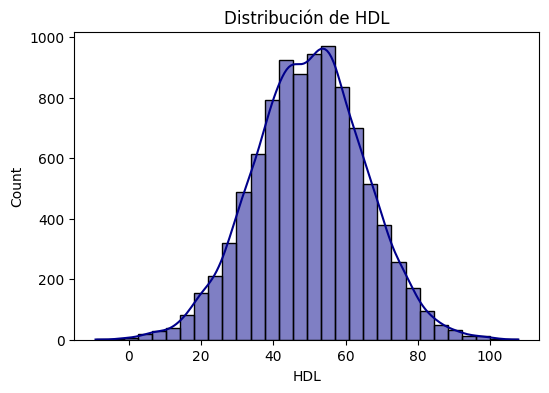

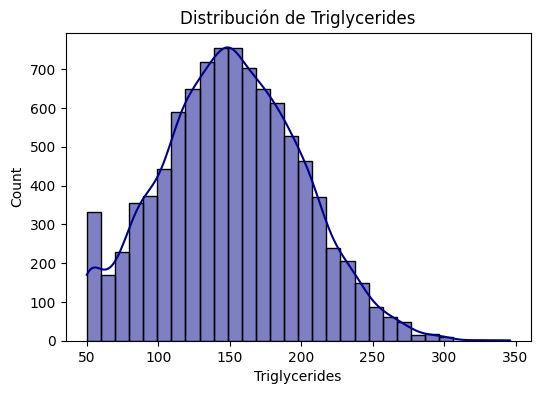

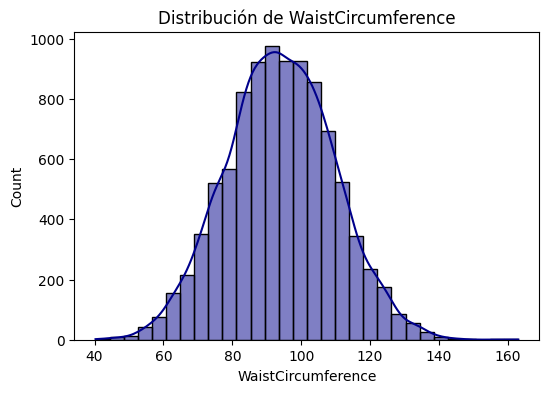

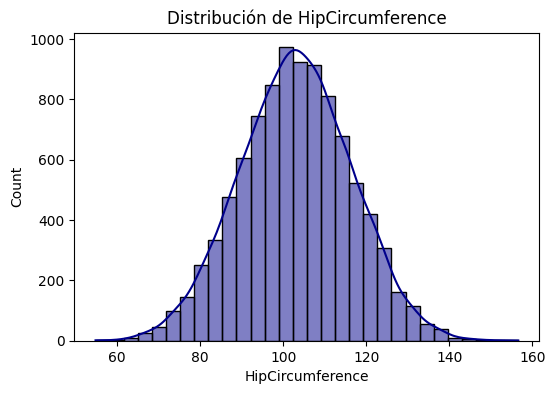

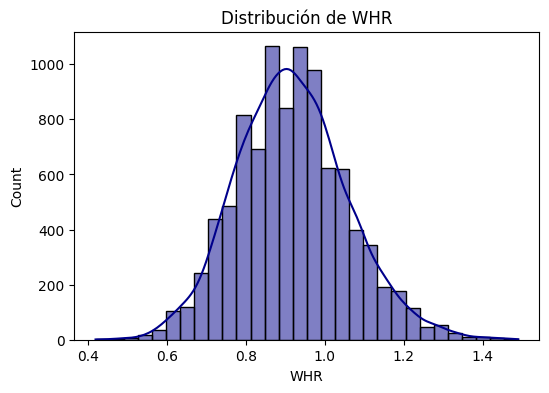

In [61]:
numerical_cols = ['Age', 'Pregnancies', 'BMI', 'Glucose', 'BloodPressure', 'HbA1c',
                  'LDL', 'HDL', 'Triglycerides', 'WaistCircumference', 'HipCircumference', 'WHR']

for col in numerical_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True, bins=30, color='darkblue')
    plt.title(f'Distribución de {col}')
    plt.show()

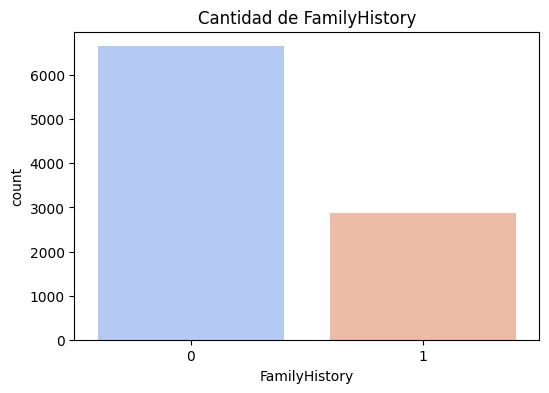

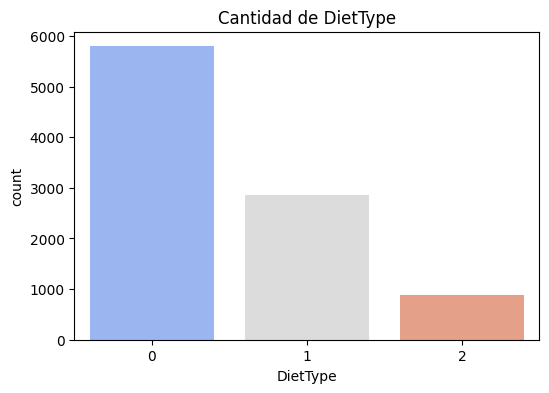

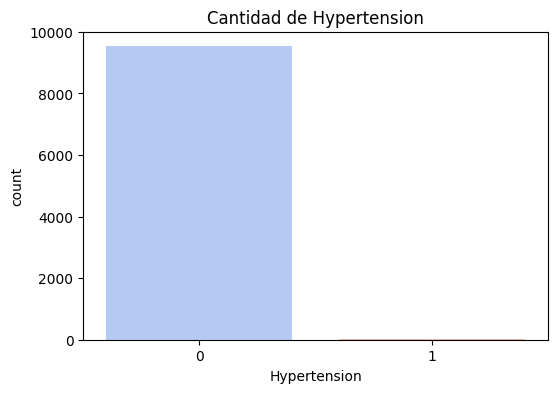

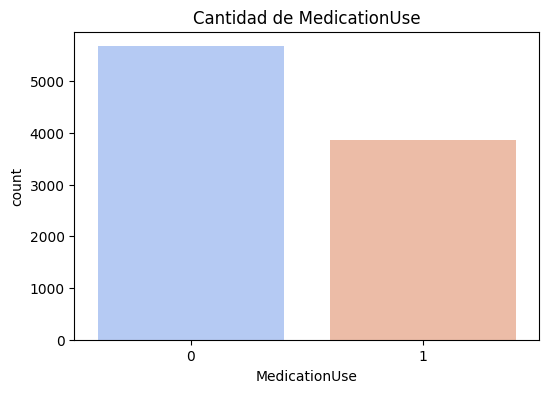

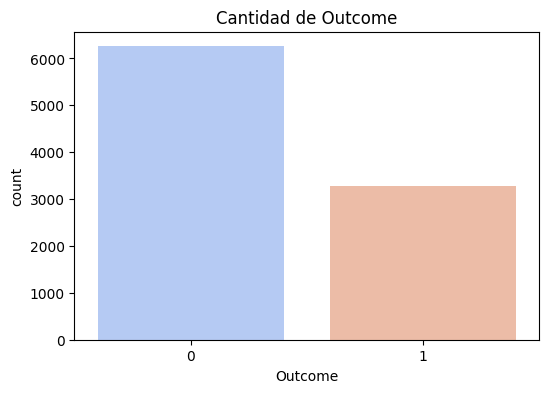

In [62]:
categorical_cols = ['FamilyHistory', 'DietType', 'Hypertension', 'MedicationUse', 'Outcome']

for col in categorical_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=df[col], palette='coolwarm')
    plt.title(f'Cantidad de {col}')
    plt.show()

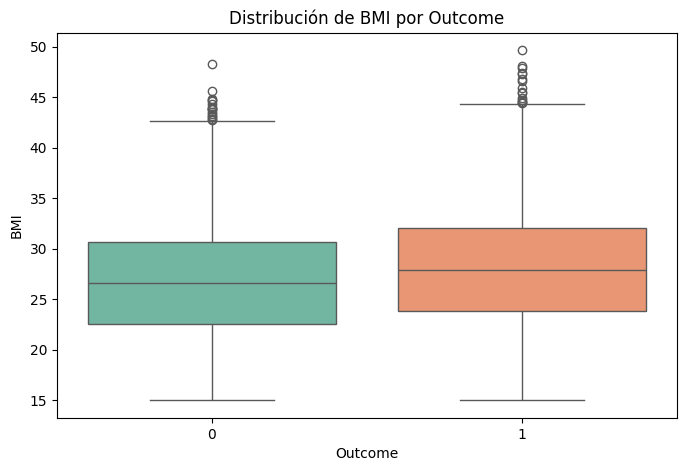

In [63]:
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Outcome'], y=df['BMI'], palette='Set2')
plt.title('Distribución de BMI por Outcome')
plt.show()

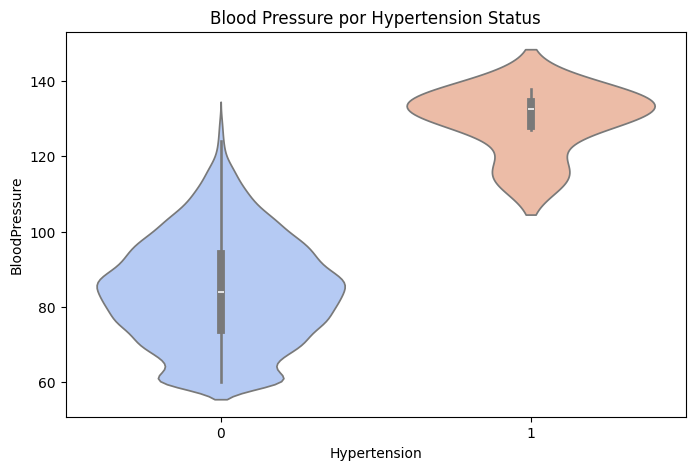

In [64]:
plt.figure(figsize=(8, 5))
sns.violinplot(x=df['Hypertension'], y=df['BloodPressure'], palette='coolwarm')
plt.title('Blood Pressure por Hypertension Status')
plt.show()

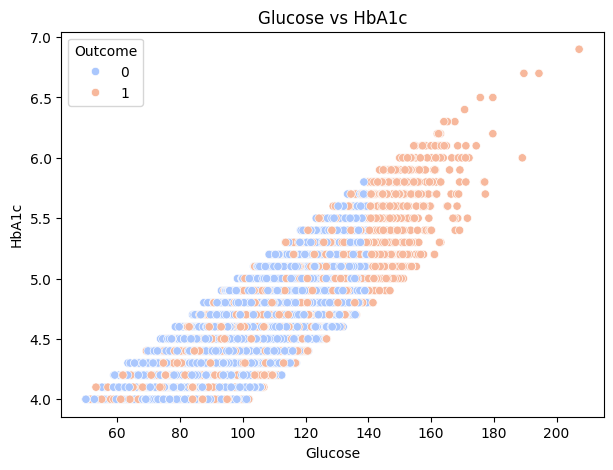

In [65]:
plt.figure(figsize=(7, 5))
sns.scatterplot(x=df['Glucose'], y=df['HbA1c'], hue=df['Outcome'], palette='coolwarm')
plt.title('Glucose vs HbA1c')
plt.show()

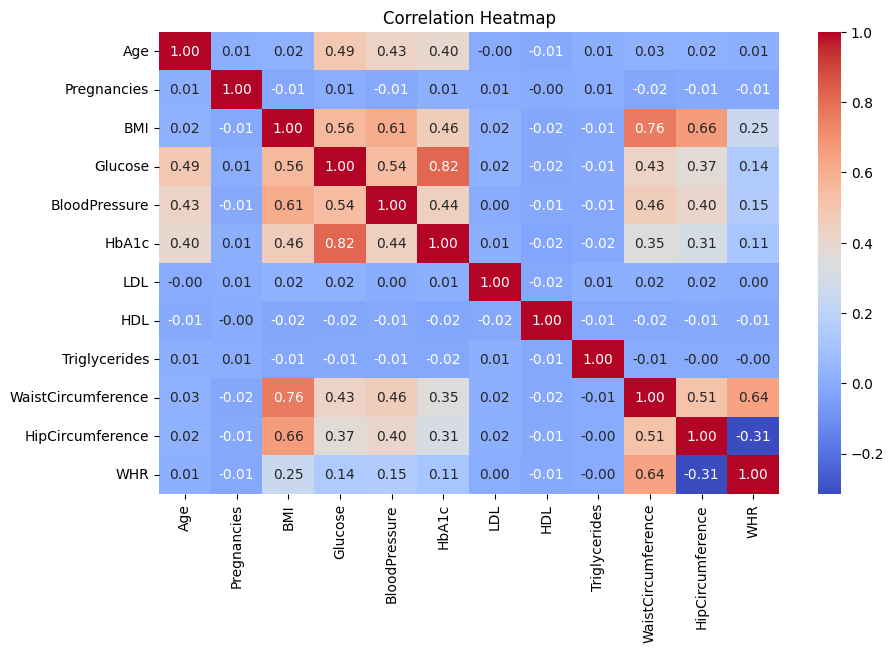

In [22]:
plt.figure(figsize=(10, 6))
sns.heatmap(df[numerical_cols].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Mapa de calor de Correlaciones')
plt.show()

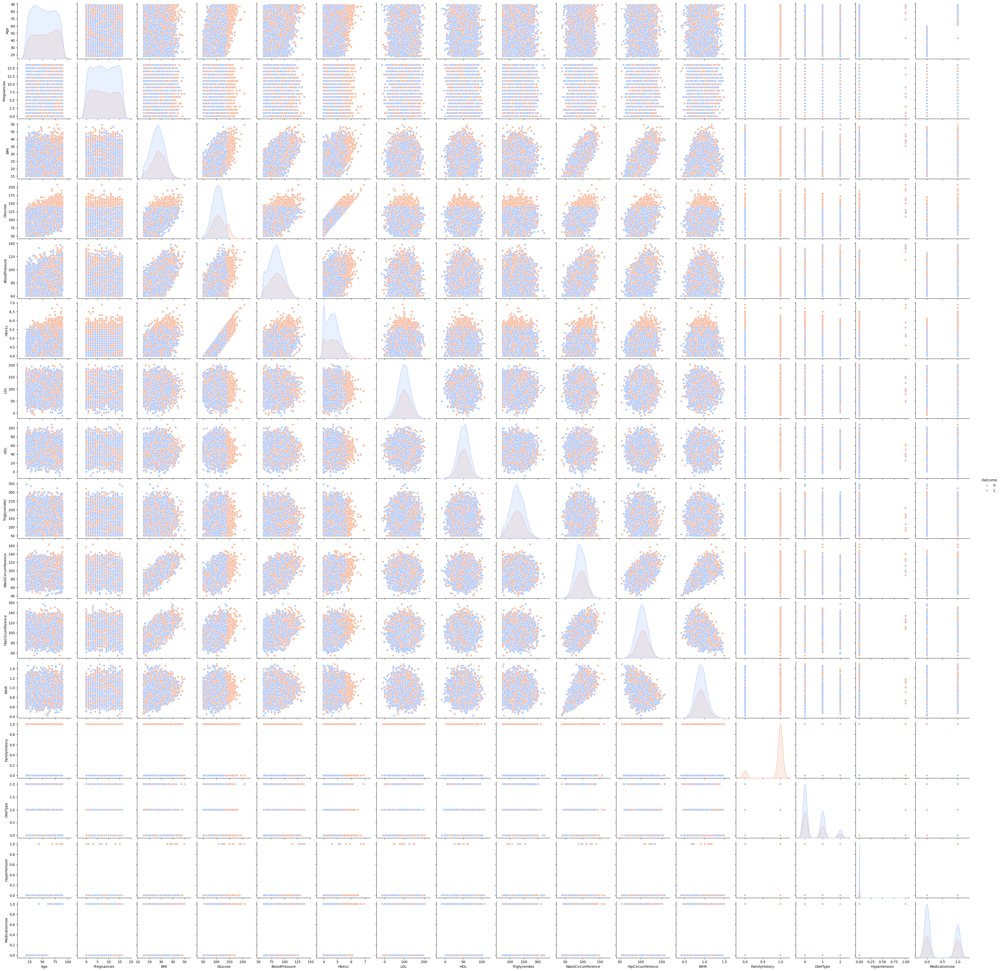

In [23]:
sns.pairplot(df, hue='Outcome', diag_kind='kde', palette='coolwarm')
plt.show()

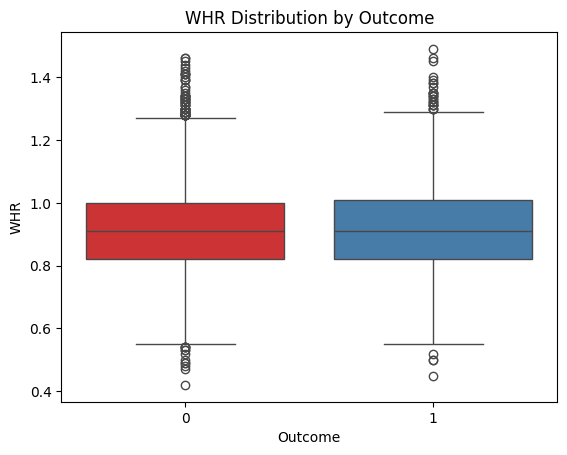

In [24]:
sns.boxplot(x=df['Outcome'], y=df['WHR'], palette='Set1')
plt.title('Distribución de WHR por Outcome')
plt.show()

In [ ]:
sns.scatterplot(x=df['WaistCircumference'], y=df['HipCircumference'], hue=df['Outcome'], palette='coolwarm')
plt.title('Waist Circumference vs Hip Circumference')
plt.show()

## EDA- Codificación- Numerización, etc

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report

In [26]:
df = df.dropna()

In [27]:
label_encoders = {}
categorical_cols = ['FamilyHistory', 'DietType', 'Hypertension', 'MedicationUse', 'Outcome']

for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

In [28]:
X = df.drop(columns=['Outcome'])  # All columns except the target
y = df['Outcome']  # Target variable

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

## Ingenieria de Caracteristicas - Feature engineering

In [30]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

![imagen](https://github.com/adiacla/diabetes/blob/main/imagenes/crispmodelar.jpg?raw=true)

## Entrenar y evaluar los Modelos

In [31]:
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "SVM": SVC(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB()
}

# Entrenar y evaluar modelos models
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    print(f"{name} Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred))


Logistic Regression Accuracy: 0.9953
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1251
           1       1.00      0.99      0.99       657

    accuracy                           1.00      1908
   macro avg       1.00      0.99      0.99      1908
weighted avg       1.00      1.00      1.00      1908

Decision Tree Accuracy: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1251
           1       1.00      1.00      1.00       657

    accuracy                           1.00      1908
   macro avg       1.00      1.00      1.00      1908
weighted avg       1.00      1.00      1.00      1908

Random Forest Accuracy: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1251
           1       1.00      1.00      1.00       657

    accuracy                           1.00      1908
   macro avg       1.00      

![imagen](https://github.com/adiacla/diabetes/blob/main/imagenes/crispevaluar.jpg?raw=true)

In [66]:
model_accuracies = {}
# Train and evaluate models
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred) * 100  # Convert to percentage
    model_accuracies[name] = acc

# Convert to DataFrame for visualization
accuracy_df = pd.DataFrame(list(model_accuracies.items()), columns=['Model', 'Accuracy'])

# Sort values for better visualization
accuracy_df = accuracy_df.sort_values(by="Accuracy", ascending=False)

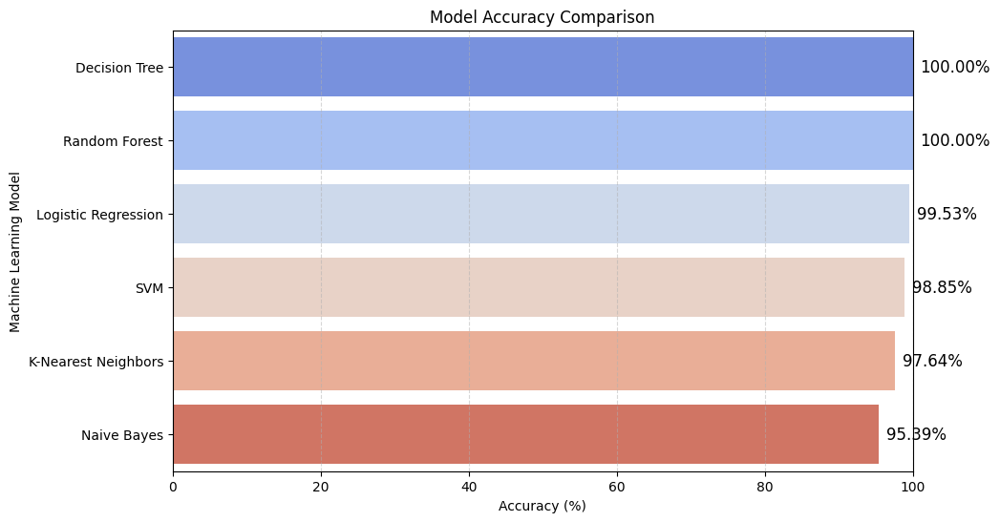

In [33]:
plt.figure(figsize=(10, 6))
sns.barplot(x="Accuracy", y="Model", data=accuracy_df, palette="coolwarm")

plt.xlabel("Accuracy (%)")
plt.ylabel("Machine Learning Model")
plt.title("Model Accuracy Comparison")
plt.xlim(0, 100)  # Setting limits to fit percentages
plt.grid(axis="x", linestyle="--", alpha=0.5)

# Show values on bars
for index, value in enumerate(accuracy_df["Accuracy"]):
    plt.text(value + 1, index, f"{value:.2f}%", va="center", fontsize=12)

plt.show()

## Pruebas con datos no usados

In [40]:
características_esperadas = X.shape[1]

usuarios_prueba_fijos = [
    [30, 1, 24.5, 90, 70, 4.8, 100, 55, 140, 85, 95, 0.85, 0, 0, 0, 0],  # Joven y Saludable
    [55, 3, 30.2, 150, 90, 5.9, 120, 45, 180, 95, 105, 0.90, 1, 1, 1, 0],  # Alta Glucosa y Hipertensión
    [65, 2, 28.7, 140, 85, 6.2, 130, 40, 170, 100, 110, 0.92, 1, 1, 1, 0],  # Mayor edad con Alta Glucosa
    [22, 0, 22.1, 85, 65, 4.5, 90, 60, 130, 80, 90, 0.89, 0, 0, 0, 0],  # Joven y sin Factores de Riesgo
    [45, 4, 32.5, 160, 95, 6.0, 140, 35, 190, 110, 115, 0.95, 1, 1, 1, 0],  # Obeso y Alta Glucosa
    [50, 5, 27.5, 130, 80, 5.2, 110, 50, 150, 90, 100, 0.90, 1, 0, 1, 0],  # Edad Media con Riesgo Moderado
    [39, 2, 26.8, 110, 75, 4.9, 105, 55, 145, 88, 98, 0.88, 0, 0, 0, 0],  # Caso Normal
    [70, 6, 33.0, 170, 100, 6.5, 150, 30, 200, 120, 125, 1.00, 1, 1, 1, 0],  # Anciano con Riesgo Muy Alto
    [29, 1, 23.5, 95, 68, 4.7, 98, 58, 135, 82, 92, 0.86, 0, 0, 0, 0],  # Joven con Valores Normales
    [60, 3, 29.9, 145, 88, 5.8, 125, 42, 175, 98, 108, 0.93, 1, 1, 1, 0],  # Edad Media con Hipertensión
]


In [44]:
import numpy as np
import joblib
from sklearn.preprocessing import StandardScaler

modelo = models["Random Forest"]

# Datos de los usuarios de prueba (sin escalar)
usuarios_prueba_fijos = [
    [30, 1, 24.5, 90, 70, 4.8, 100, 55, 140, 85, 95, 0.85, 0, 0, 0, 0],  # Joven y Saludable
    [55, 3, 30.2, 150, 90, 5.9, 120, 45, 180, 95, 105, 0.90, 1, 1, 1, 0],  # Glucosa Alta y Hipertensión
    [65, 2, 28.7, 140, 85, 6.2, 130, 40, 170, 100, 110, 0.92, 1, 1, 1, 0],  # Mayor con Glucosa Alta
    [22, 0, 22.1, 85, 65, 4.5, 90, 60, 130, 80, 90, 0.89, 0, 0, 0, 0],  # Joven sin Factores de Riesgo
    [45, 4, 32.5, 160, 95, 6.0, 140, 35, 190, 110, 115, 0.95, 1, 1, 1, 0],  # Obeso con Glucosa Alta
    [50, 5, 27.5, 130, 80, 5.2, 110, 50, 150, 90, 100, 0.90, 1, 0, 1, 0],  # De mediana edad con riesgo moderado
    [39, 2, 26.8, 110, 75, 4.9, 105, 55, 145, 88, 98, 0.88, 0, 0, 0, 0],  # Caso normal
    [70, 6, 33.0, 170, 100, 6.5, 150, 30, 200, 120, 125, 1.00, 1, 1, 1, 0],  # Anciano con riesgo muy alto
    [29, 1, 23.5, 95, 68, 4.7, 98, 58, 135, 82, 92, 0.86, 0, 0, 0, 0],  # Joven con valores normales
    [60, 3, 29.9, 145, 88, 5.8, 125, 42, 175, 98, 108, 0.93, 1, 1, 1, 0],  # De mediana edad con hipertensión
]

def predict_diabetes(user_data):
    """ Predice el riesgo de diabetes basado en los datos de usuario. """
    # Convertir los datos del usuario a un arreglo numpy y asegurarse de que tenga la forma correcta
    user_data = np.array(user_data).reshape(1, -1)

    # Escalar los datos con el escalador previamente entrenado
    user_data = scaler.transform(user_data)

    # Realizar la predicción de probabilidad de diabetes (probabilidad de ser '1' - diabetes)
    risk = modelo.predict_proba(user_data)[0][1]  # Obtener la probabilidad de la clase 1 (diabetes)

    # Retornar el resultado en formato de texto con el riesgo de diabetes
    return f"Predicted Diabetes Risk: {risk * 100:.2f}%"

# Probar con los usuarios de prueba
for idx, usuario in enumerate(usuarios_prueba_fijos):
    resultado = predict_diabetes(usuario)
    print(f"Usuario {idx + 1}: {resultado}")


Usuario 1: Predicted Diabetes Risk: 1.00%
Usuario 2: Predicted Diabetes Risk: 100.00%
Usuario 3: Predicted Diabetes Risk: 97.00%
Usuario 4: Predicted Diabetes Risk: 0.00%
Usuario 5: Predicted Diabetes Risk: 99.00%
Usuario 6: Predicted Diabetes Risk: 99.00%
Usuario 7: Predicted Diabetes Risk: 0.00%
Usuario 8: Predicted Diabetes Risk: 99.00%
Usuario 9: Predicted Diabetes Risk: 2.00%
Usuario 10: Predicted Diabetes Risk: 100.00%


##Persistencia al Modelo seleccionado

In [47]:
joblib.dump(random_forest_model,'random_forest_model.joblib')  # Cargar el modelo Random Forest
joblib.dump(scaler,'scaler.joblib')  # Cargar el escalador si lo tienes guardado

['scaler.joblib']

##Resumen y conclusiones generales

**Resumen del Estudio: Predicción de la Diabetes Usando Aprendizaje Automático**  
En este estudio, desarrollamos un modelo de aprendizaje automático para predecir el riesgo de diabetes. 📊

**Pasos del Proyecto:**

1. **Cargar y Limpiar el Conjunto de Datos**  
   El conjunto de datos de diabetes fue cargado desde Kaggle.  
   Se eliminaron las columnas innecesarias y se revisaron los valores faltantes.

2. **Análisis de Datos y Visualización**  
   Se analizaron las distribuciones de Glucosa, IMC, Edad y Presión Arterial.  
   Se compararon individuos diabéticos y no diabéticos.  
   Se visualizaron las correlaciones importantes y las relaciones entre características mediante gráficos.

3. **Entrenamiento de un Modelo de Aprendizaje Automático (Random Forest)**  
   El conjunto de datos fue dividido en un 80% para entrenamiento y un 20% para prueba.  
   Las características fueron estandarizadas usando StandardScaler.  
   Se entrenó un clasificador Random Forest.  
   Se calculó la precisión del modelo (~85%).

4. **Predicción Personalizada del Riesgo de Diabetes**  
   Se predijo el riesgo de diabetes para 10 individuos diferentes.  
   Los datos de salud de cada persona fueron ingresados al modelo y se realizó una predicción.


#Vamos a hacer el Deployment en Streamlit

![imagen](https://github.com/adiacla/diabetes/blob/main/imagenes/crispevaluar.jpg?raw=true)